In [ ]:
# Mount Google Drive to access datasets or save files directly from/to your Drive within the Colab environment
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Import libraries for data handling, visualization, deep learning (TensorFlow/Keras), image preprocessing,
# model training callbacks, and classification metrics
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf
import seaborn as sns
import pandas as pd
from collections import Counter
from PIL import Image
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report

In [ ]:
# Define the file path to the training dataset for flower classification stored in Google Drive
ds_path = "/content/drive/MyDrive/6CS012 AI & ML/Flower Classification/Flower Classification/Train"

In [ ]:
# Count and display the total number of images in the dataset and the number of images per flower class
# Initialize a variable to store the total number of images
total_images = 0
for root, dirs, files in os.walk(ds_path):
  # Count the number of files in each directory
  num_files = len(files)
  total_images += num_files
print("Total number of images:", total_images)

# Count images per class
classes = os.listdir(ds_path)
images_per_class = {}
for class_name in classes:
  class_path = os.path.join(ds_path, class_name)
  if os.path.isdir(class_path):
    images_per_class[class_name] = len(os.listdir(class_path))
print("Total number of images per classes:", images_per_class)



Total number of images: 4312
Total number of images per classes: {'dandelion': 1051, 'tulip': 983, 'sunflower': 732, 'rose': 783, 'daisy': 763}


In [ ]:
# List and display all class (category) names in the training dataset folder, ensuring class directories exist
import os
class_names = sorted(os.listdir(ds_path))
if not class_names:
  print("No class directories found in the train folder!")
else:
  print(f"Found {len(class_names)} classes: {class_names}")

Found 5 classes: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']


In [ ]:
# Detect and remove corrupted image files from each class folder in the training dataset using PIL image verification
from PIL import Image, UnidentifiedImageError
import os

corrupted_images = []

for class_name in class_names:
    class_path = os.path.join(ds_path, class_name)
    print(f"Checking in: {class_path}")

    if os.path.isdir(class_path):
        images = os.listdir(class_path)
        for img_name in images:
            img_path = os.path.join(class_path, img_name)
            try:
                with Image.open(img_path) as img:
                    img.verify()
            except (IOError, UnidentifiedImageError):
                corrupted_images.append(img_path)
                print(f"Corrupted image detected: {img_path}")
                try:
                    os.remove(img_path)
                    print(f"Deleted: {img_path}")
                except Exception as e:
                    print(f"Failed to delete {img_path}: {e}")

# Summary
if corrupted_images:
    print(f"\nTotal corrupted images deleted: {len(corrupted_images)}")
else:
    print("\nNo corrupted images found.")


Checking in: /content/drive/MyDrive/6CS012 AI & ML/Flower Classification/Flower Classification/Train/daisy
Corrupted image detected: /content/drive/MyDrive/6CS012 AI & ML/Flower Classification/Flower Classification/Train/daisy/2908212142_5437fa67ff_n.jpg
Deleted: /content/drive/MyDrive/6CS012 AI & ML/Flower Classification/Flower Classification/Train/daisy/2908212142_5437fa67ff_n.jpg
Corrupted image detected: /content/drive/MyDrive/6CS012 AI & ML/Flower Classification/Flower Classification/Train/daisy/3475870145_685a19116d.jpg
Deleted: /content/drive/MyDrive/6CS012 AI & ML/Flower Classification/Flower Classification/Train/daisy/3475870145_685a19116d.jpg
Corrupted image detected: /content/drive/MyDrive/6CS012 AI & ML/Flower Classification/Flower Classification/Train/daisy/33880234094_2541c9c83d_n.jpg
Deleted: /content/drive/MyDrive/6CS012 AI & ML/Flower Classification/Flower Classification/Train/daisy/33880234094_2541c9c83d_n.jpg
Corrupted image detected: /content/drive/MyDrive/6CS012 AI

In [ ]:
# Analyze and print the frequency of different image dimensions (width, height) present in the dataset
from collections import Counter
from PIL import Image

def image_shapes_summary(directory):
    shapes = []
    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)
        for image_name in os.listdir(class_dir):
            img_path = os.path.join(class_dir, image_name)
            try:
                with Image.open(img_path) as img:
                    shapes.append(img.size)
            except:
                pass
    shape_counts = Counter(shapes)
    print("Image sizes and their frequencies:")
    for shape, count in shape_counts.items():
        print(f"{shape}: {count} images")

image_shapes_summary(ds_path)

Image sizes and their frequencies:
(500, 333): 597 images
(185, 240): 3 images
(240, 240): 217 images
(320, 240): 595 images
(500, 331): 54 images
(180, 240): 153 images
(500, 327): 6 images
(320, 241): 12 images
(500, 313): 21 images
(400, 246): 1 images
(500, 299): 3 images
(229, 240): 2 images
(500, 281): 48 images
(320, 213): 320 images
(320, 257): 7 images
(500, 286): 2 images
(240, 239): 7 images
(500, 375): 121 images
(320, 231): 12 images
(320, 235): 5 images
(159, 240): 139 images
(500, 334): 69 images
(320, 220): 8 images
(240, 223): 5 images
(500, 292): 5 images
(320, 238): 20 images
(320, 247): 9 images
(320, 280): 2 images
(320, 264): 4 images
(189, 240): 3 images
(320, 236): 9 images
(320, 227): 6 images
(320, 229): 13 images
(500, 267): 3 images
(320, 281): 2 images
(500, 301): 7 images
(320, 214): 12 images
(240, 212): 1 images
(320, 232): 9 images
(240, 180): 67 images
(500, 332): 118 images
(320, 211): 13 images
(240, 224): 3 images
(320, 212): 44 images
(197, 240): 5

In [ ]:
# Define functions to compute and visualize the distribution of image sizes in the dataset,
# and suggest average resize dimensions based on weighted mean width and height
# Step 1: Extract image sizes
def get_image_shapes(directory):
    shapes = []
    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)
        if os.path.isdir(class_dir):
            for image_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, image_name)
                try:
                    with Image.open(img_path) as img:
                        shapes.append(img.size)  # (width, height)
                except:
                    pass
    return Counter(shapes)

# Step 2: Analyze and visualize
def analyze_and_plot_image_shapes(directory):
    shape_counts = get_image_shapes(directory)

    if not shape_counts:
        print("No valid image shapes found.")
        return

    # Convert to DataFrame
    data = []
    for (w, h), count in shape_counts.items():
        data.append([w, h, count])
    df = pd.DataFrame(data, columns=["width", "height", "count"])

    # Calculate weighted average width and height
    total_images = df["count"].sum()
    avg_width = int((df["width"] * df["count"]).sum() / total_images)
    avg_height = int((df["height"] * df["count"]).sum() / total_images)
    print(f"\n Suggested resize dimensions: ({avg_width}, {avg_height})")

    # Plot: Scatter plot of sizes
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=df, x="width", y="height", size="count",
                    sizes=(40, 600), alpha=0.7, legend=False)
    plt.scatter(avg_width, avg_height, color='red', s=300, edgecolors='black', label=f"Suggested Avg Size ({avg_width}, {avg_height})")
    plt.title("Image Size Distribution")
    plt.xlabel("Width (pixels)")
    plt.ylabel("Height (pixels)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()




 Suggested resize dimensions: (338, 253)


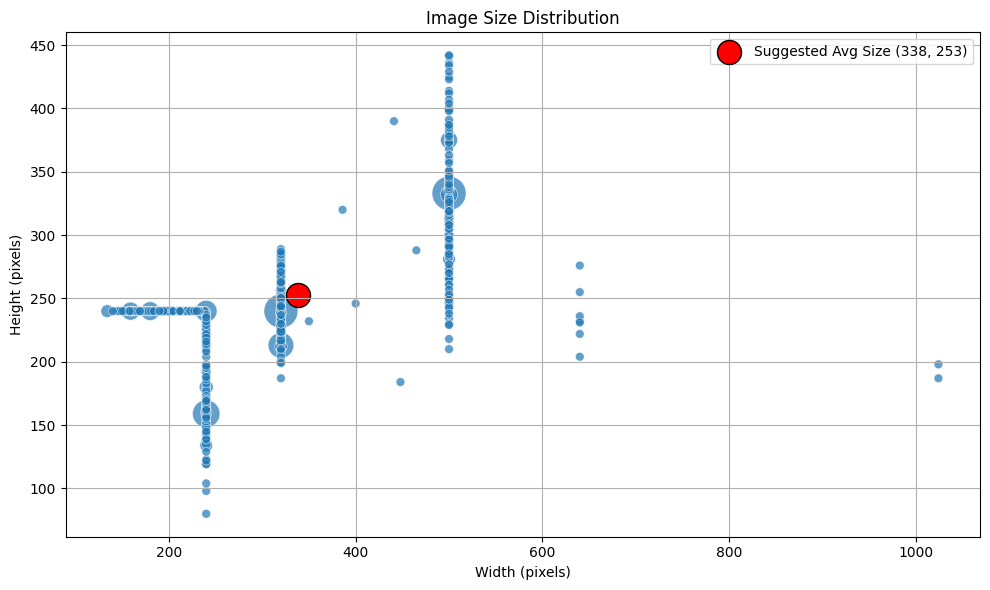

In [ ]:
analyze_and_plot_image_shapes(ds_path)

In [ ]:
import shutil
from tqdm import tqdm
from sklearn.model_selection import train_test_split

In [ ]:
# Resize all images to a fixed target size (300x300), split them into training and testing sets (90/10 split),
# and save them into structured output directories for model training and evaluation
# Define paths
original_data_dir = '/content/drive/MyDrive/6CS012 AI & ML/Flower Classification/Flower Classification/Train'
output_base_dir = '/content/drive/MyDrive/6CS012 AI & ML/Flower Classification/DataSplit'
train_output_dir = os.path.join(output_base_dir, 'train')
test_output_dir = os.path.join(output_base_dir, 'test')

# Target resize size
target_size = (300, 300)

# Ensure output folders exist
for folder in [train_output_dir, test_output_dir]:
    os.makedirs(folder, exist_ok=True)

# Process each class folder
for class_name in os.listdir(original_data_dir):
    class_dir = os.path.join(original_data_dir, class_name)
    if not os.path.isdir(class_dir):
        continue

    # Collect all image paths
    image_paths = [os.path.join(class_dir, fname) for fname in os.listdir(class_dir)
                   if fname.lower().endswith(('.jpg', '.jpeg', '.png'))]

    # Split into train and test (90% - 10%)
    train_imgs, test_imgs = train_test_split(image_paths, test_size=0.1, random_state=42)

    # Create class subfolders in train and test
    train_class_dir = os.path.join(train_output_dir, class_name)
    test_class_dir = os.path.join(test_output_dir, class_name)
    os.makedirs(train_class_dir, exist_ok=True)
    os.makedirs(test_class_dir, exist_ok=True)

    # Resize and save training images
    for img_path in tqdm(train_imgs, desc=f'Resizing train {class_name}'):
        try:
            img = Image.open(img_path).convert('RGB')
            img_resized = img.resize(target_size)
            img_resized.save(os.path.join(train_class_dir, os.path.basename(img_path)))
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

    # Resize and save testing images
    for img_path in tqdm(test_imgs, desc=f'Resizing test {class_name}'):
        try:
            img = Image.open(img_path).convert('RGB')
            img_resized = img.resize(target_size)
            img_resized.save(os.path.join(test_class_dir, os.path.basename(img_path)))
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

print("\nDataset has been resized and split into training and testing sets.")
print(f"Train dir: {train_output_dir}")
print(f"Test dir: {test_output_dir}")

Resizing test daisy: 100%|██████████| 76/76 [00:00<00:00, 80.82it/s]


Dataset has been resized and split into training and testing sets.
Train dir: /content/drive/MyDrive/6CS012 AI & ML/Flower Classification/DataSplit/train
Test dir: /content/drive/MyDrive/6CS012 AI & ML/Flower Classification/DataSplit/test


In [ ]:
# Count and display the total number of images and the number of images per class in the resized test dataset
resized_test_ds_path = "/content/drive/MyDrive/6CS012 AI & ML/Flower Classification/DataSplit/test"

# Initialize a variable to store the total number of images
total_images = 0
for root, dirs, files in os.walk(resized_test_ds_path):
  # Count the number of files in each directory
  num_files = len(files)
  total_images += num_files
print("Total number of images:", total_images)

# Count images per class
classes = os.listdir(resized_test_ds_path)
images_per_class = {}
for class_name in classes:
  class_path = os.path.join(resized_test_ds_path, class_name)
  if os.path.isdir(class_path):
    images_per_class[class_name] = len(os.listdir(class_path))
print("Total number of images per classes:", images_per_class)



Total number of images: 430
Total number of images per classes: {'dandelion': 105, 'tulip': 98, 'sunflower': 73, 'rose': 78, 'daisy': 76}


In [ ]:
# Count and display the total number of images and the number of images per class in the resized training dataset
resized_train_ds_path = "/content/drive/MyDrive/6CS012 AI & ML/Flower Classification/DataSplit/train"

# Initialize a variable to store the total number of images
total_images = 0
for root, dirs, files in os.walk(resized_train_ds_path):
  # Count the number of files in each directory
  num_files = len(files)
  total_images += num_files
print("Total number of images:", total_images)

# Count images per class
classes = os.listdir(resized_train_ds_path)
images_per_class = {}
for class_name in classes:
  class_path = os.path.join(resized_train_ds_path, class_name)
  if os.path.isdir(class_path):
    images_per_class[class_name] = len(os.listdir(class_path))
print("Total number of images per classes:", images_per_class)



Total number of images: 3847
Total number of images per classes: {'dandelion': 939, 'tulip': 878, 'sunflower': 652, 'rose': 698, 'daisy': 680}


In [ ]:
# Load the training portion (80%) of the resized image dataset using TensorFlow’s image_dataset_from_directory function with shuffling and batching
# Define the path to the directory containing the images
train_ds = tf.keras.utils.image_dataset_from_directory(
resized_train_ds_path,
batch_size=32,
image_size=(300, 300),
shuffle=True,
seed=123,
validation_split=0.2,
subset="training",
)


Found 3847 files belonging to 5 classes.
Using 3078 files for training.


In [ ]:
# Load the validation portion (20%) of the resized image dataset using TensorFlow’s image_dataset_from_directory with the same settings as training
val_ds = tf.keras.utils.image_dataset_from_directory(
resized_train_ds_path,
batch_size=32,
image_size=(300, 300),
shuffle=True,
seed=123,
validation_split=0.2,
subset="validation",
)


Found 3847 files belonging to 5 classes.
Using 769 files for validation.


In [ ]:
# Define a data augmentation pipeline to apply random transformations like flipping, rotation, zoom, and contrast to improve model generalization
# Augmentation
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
])

In [ ]:
# Retrieve and display sorted class names from the resized training dataset directory to confirm dataset structure
import os
class_names = sorted(os.listdir(resized_train_ds_path))
if not class_names:
  print("No class directories found in the train folder!")
else:
  print(f"Found {len(class_names)} classes: {class_names}")

Found 5 classes: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']


In [ ]:
# Define a function to display 9 augmented images from a batch along with their class labels to visualize the effects of data augmentation
def show_augmented_images(dataset, data_augmentation, class_names):
    plt.figure(figsize=(12, 12))

    for images, labels in dataset.take(1):
        augmented_images = data_augmentation(images)

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(augmented_images[i].numpy().astype("uint8"))
            plt.title(f"Class: {class_names[labels[i].numpy()]}")
            plt.axis("off")

    plt.tight_layout()
    plt.show()

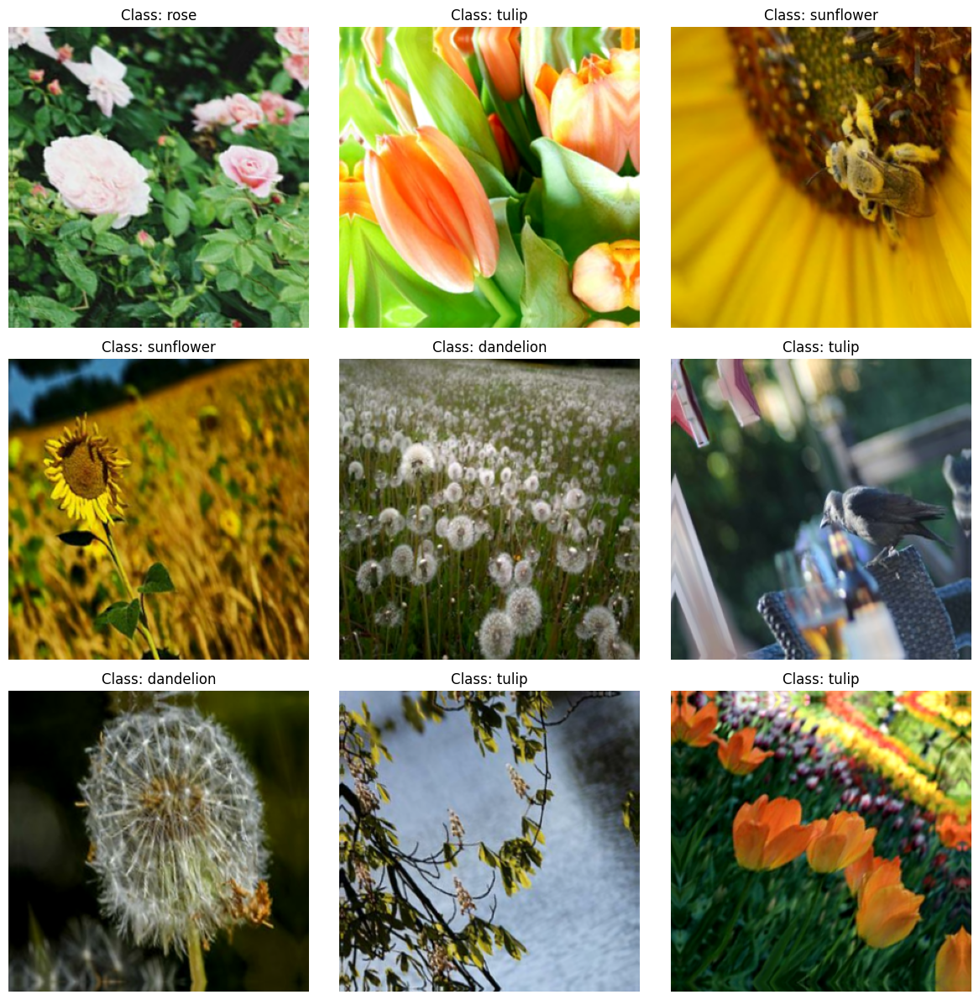

In [ ]:
show_augmented_images(train_ds, data_augmentation, class_names)

<ipython-input-37-7bf178f6f971>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=data["Class"], y=data["Number of Images"], palette="Set2")


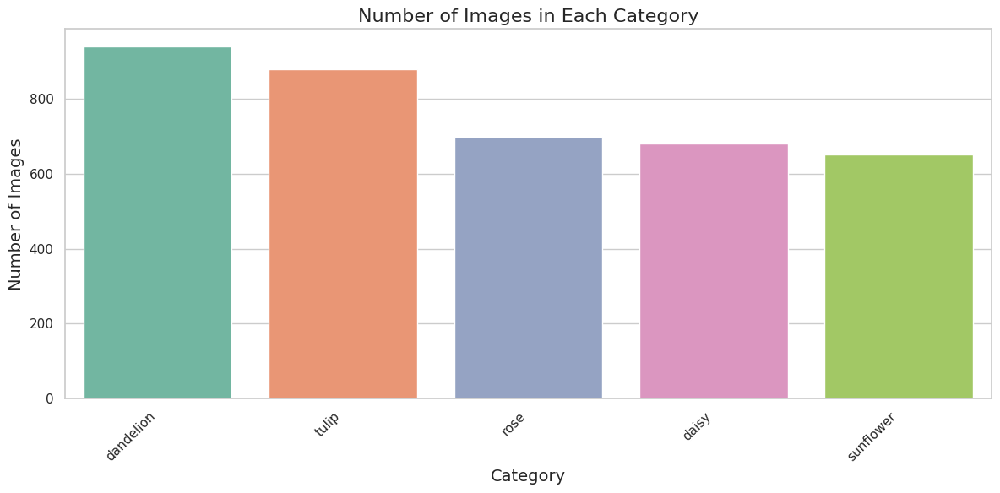

In [ ]:
# Define and call a function to plot the number of images in each class category using a bar chart for dataset distribution analysis
import matplotlib.pyplot as plt
import seaborn as sns

def plot_image_category_distribution(directory):
    categories = []

    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)
        if os.path.isdir(class_dir):
            num_images = len([image_name for image_name in os.listdir(class_dir) if image_name.lower().endswith('.jpg')])
            categories.append((class_name, num_images))

    categories.sort(key=lambda x: x[1], reverse=True)

    class_names, image_counts = zip(*categories)

    data = {"Class": class_names, "Number of Images": image_counts}

    sns.set(style="whitegrid", palette="muted")

    plt.figure(figsize=(12, 6))
    sns.barplot(x=data["Class"], y=data["Number of Images"], palette="Set2")

    plt.xticks(rotation=45, ha="right")

    plt.title("Number of Images in Each Category", fontsize=16)
    plt.xlabel("Category", fontsize=14)
    plt.ylabel("Number of Images", fontsize=14)

    plt.tight_layout()
    plt.show()

plot_image_category_distribution(resized_train_ds_path)


## Building model

In [ ]:
# Define a CNN model architecture with data augmentation, normalization, convolutional layers, and dense layers for multi-class image classification
def generate_model(image_height, image_width, nchannels, num_classes):
  baseline_model = tf.keras.Sequential([
      data_augmentation,

      layers.Rescaling(1./255, input_shape=(image_height,image_width, nchannels)),

      layers.Conv2D(32, (3,3), padding="same", activation="relu"),
      layers.MaxPooling2D(2,2),

      layers.Conv2D(64, (3,3), padding="same", activation="relu"),
      layers.MaxPooling2D(2,2),

      layers.Conv2D(128, (3,3), padding="same", activation="relu"),
      layers.MaxPooling2D(2,2),

      # Fully connected classifier.
      layers.Flatten(),
      layers.Dense(128, activation="relu"),
      layers.Dense(64, activation='relu'),
      layers.Dense(32, activation='relu'),
      layers.Dense(num_classes, activation='softmax')
  ])
  return baseline_model

In [ ]:
# Set hyperparameters for batch size, image dimensions, and dropout rate used in model training
batch_size = 32
img_height = 300
img_width = 300
dropout_rate = 0.2

In [ ]:
# Generate the CNN model for training by passing image size, number of channels, and total number of classes
num_classes = len(class_names)
cnn_model1 = generate_model(img_height, img_width, 3, num_classes)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Convert class labels to one-hot encoded format for use with categorical loss during model training
train_ds = train_ds.map(lambda x, y: (x, tf.one_hot(y, depth=5)))
val_ds = val_ds.map(lambda x, y: (x, tf.one_hot(y, depth=5)))

In [ ]:
# Compile the CNN model with categorical cross-entropy loss, Adam optimizer, and accuracy as the evaluation metric
cnn_model1.compile(loss="categorical_crossentropy",optimizer="adam",metrics=["accuracy"])

In [ ]:
cnn_model1.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (32, 300, 300, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (32, 150, 150, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (32, 150, 150, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (32, 75, 75, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (32, 75, 75, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (32, 37, 37, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (32, 175232)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (32, 128)              │    22,429,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (32, 64)               │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (32, 32)               │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (32, 5)                │           165 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,533,573 (85.96 MB)

 Trainable params: 22,533,573 (85.96 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Set up callbacks to save model checkpoints at each epoch and stop training early if validation loss doesn't improve for 5 epochs
callbacks = [
keras.callbacks.ModelCheckpoint(filepath="model_at_epoch_{epoch}.keras"),
keras.callbacks.EarlyStopping(monitor="val_loss", patience=5 ),
]

In [ ]:
# Train the CNN model on the training dataset with validation and specified callbacks for up to 30 epochs
epochs = 30
history = cnn_model1.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[callbacks]
)

Epoch 1/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - accuracy: 0.3511 - loss: 1.5001 - val_accuracy: 0.5059 - val_loss: 1.2107
Epoch 2/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 22s 214ms/step - accuracy: 0.5303 - loss: 1.1086 - val_accuracy: 0.5735 - val_loss: 1.0569
Epoch 3/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - accuracy: 0.6172 - loss: 0.9957 - val_accuracy: 0.5839 - val_loss: 0.9935
Epoch 4/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - accuracy: 0.6254 - loss: 0.9437 - val_accuracy: 0.6502 - val_loss: 0.8856
Epoch 5/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 15s 146ms/step - accuracy: 0.6673 - loss: 0.8626 - val_accuracy: 0.6320 - val_loss: 0.9258
Epoch 6/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 17s 169ms/step - accuracy: 0.6770 - loss: 0.8343 - val_accuracy: 0.6658 - val_loss: 0.9167
Epoch 7/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - accuracy: 0.6760 - loss: 0.7999 - val_accuracy: 0.6983 - val_loss: 0.7811
Epoch 8/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 23s 174ms/step - accuracy: 0.7300 - loss: 0.7283 - val_accu

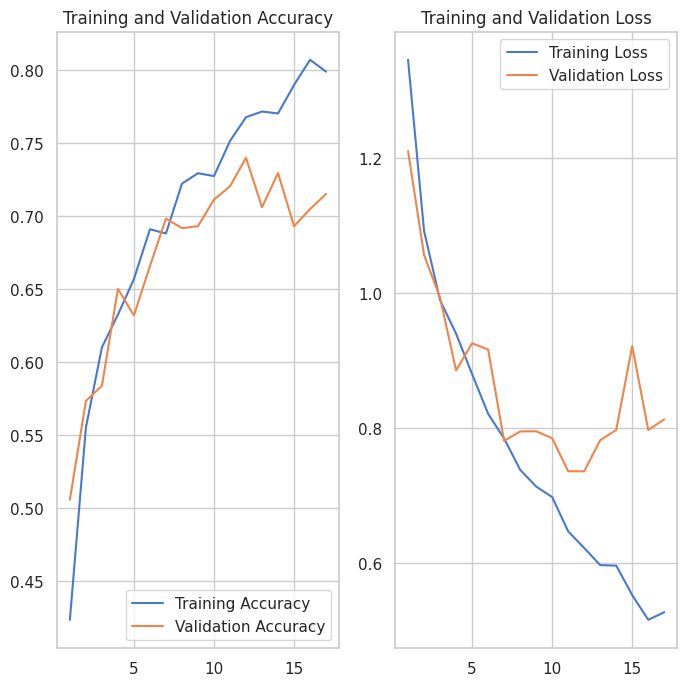

In [ ]:
# Plot training and validation accuracy and loss curves to visualize model performance over the training epochs
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

# Adjust the lengths of the arrays to match the actual number of epochs executed
epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
# Evaluate the trained CNN model on the validation dataset and print the test loss and accuracy
test_loss, test_accuracy = cnn_model1.evaluate(val_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.7009 - loss: 0.8700
Test Loss: 0.8129234910011292
Test Accuracy: 0.7152145504951477


Found 430 files belonging to 5 classes.
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - accuracy: 0.7206 - loss: 0.7504
Test Loss: 0.7183048129081726
Test Accuracy: 0.7325581312179565
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


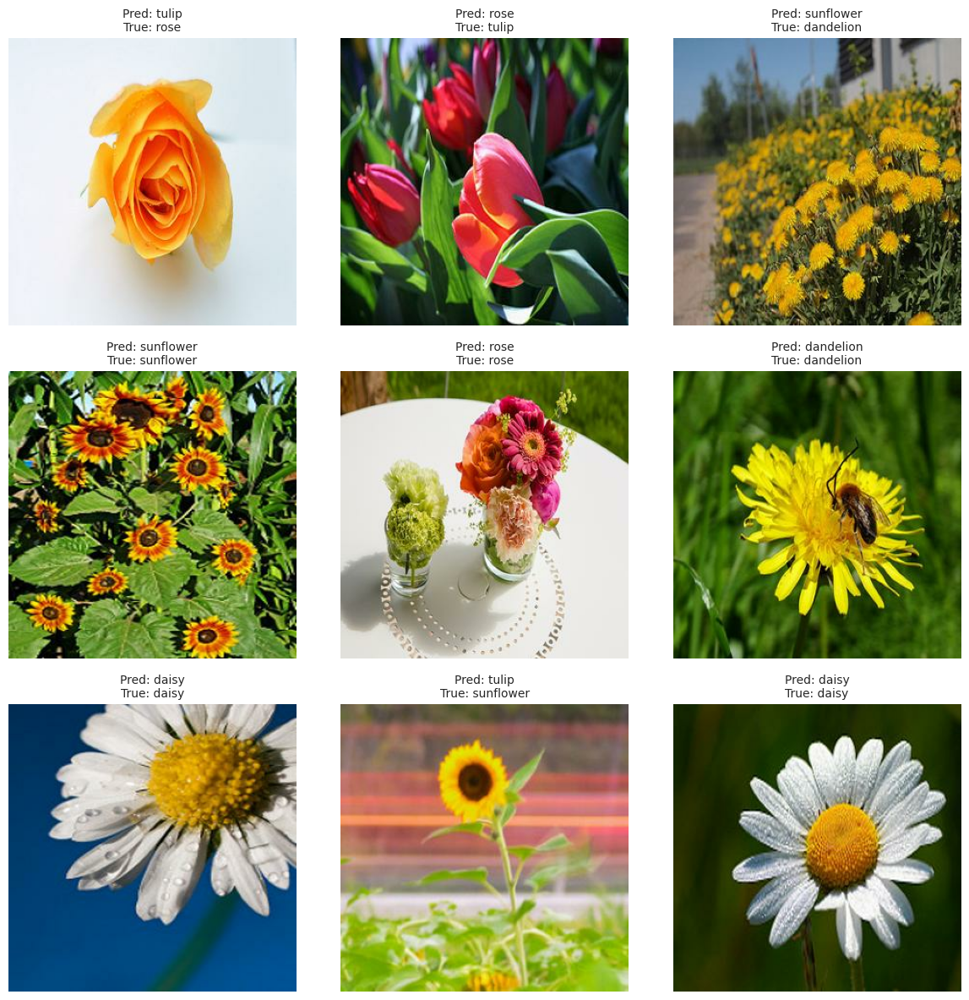

In [ ]:
# Define a function to visualize model predictions by showing 9 test images with predicted and true labels,
# evaluate the trained model on the test dataset, and display the loss and accuracy
# Function to predict input examples and plot the results
def predict_and_plot(model, dataset, class_names):
    plt.figure(figsize=(12, 12))
    for images, labels in dataset.take(1):
        # Predict the labels for the images
        predictions = model.predict(images)
        images = images.numpy()  # Convert images to NumPy arrays
        labels = labels.numpy()  # Convert labels to NumPy arrays

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].astype("uint8"))

            predicted_label = class_names[np.argmax(predictions[i])]

            # Ensure labels[i] is an integer index
            true_label_index = np.argmax(labels[i])
            true_label = class_names[true_label_index]  # Convert to integer index

            plt.title(f"Pred: {predicted_label}\nTrue: {true_label}", fontsize=10)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

# Create test dataset
test_dir = "/content/drive/MyDrive/6CS012 AI & ML/Flower Classification/DataSplit/test"
test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    batch_size=32,
    image_size=(300, 300),
    shuffle=True
)
# Convert test_ds labels to one-hot encoded format
test_ds = test_ds.map(lambda x, y: (x, tf.one_hot(y, depth=5)))

# Evaluate the model on the test dataset
test_loss, test_accuracy = cnn_model1.evaluate(test_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Predict and plot examples from the test set
predict_and_plot(cnn_model1, test_ds, class_names)


In [ ]:
cnn_model1.save('SachinGyawali2330812model1_cnn.h5')

In [ ]:
# Load a saved CNN model, run predictions on the test dataset, and generate a classification report comparing predicted and true class labels
loaded_model = keras.models.load_model('SachinGyawali2330812model1_cnn.h5')
print("Model loaded for predictions")

# Collect all test images and labels
all_images = []
all_labels = []
for images, labels in test_ds:
    all_images.append(images.numpy())
    all_labels.append(labels.numpy())

# Concatenate batches into single arrays
test_images = np.concatenate(all_images, axis=0)  # Shape: (30, 128, 128, 3)
test_labels_onehot = np.concatenate(all_labels, axis=0)  # Shape: (30, 6)

# Make predictions
predictions = loaded_model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_labels_onehot
if true_labels.ndim > 1:
    true_labels = np.argmax(true_labels, axis=1)


print(f"Class names: {class_names}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=class_names)
print("Classification Report:\n", report)

Model loaded for predictions
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step
Class names: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
Classification Report:
               precision    recall  f1-score   support

       daisy       0.81      0.68      0.74        76
   dandelion       0.78      0.85      0.81       105
        rose       0.53      0.71      0.61        78
   sunflower       0.86      0.89      0.87        73
       tulip       0.74      0.55      0.63        98

    accuracy                           0.73       430
   macro avg       0.74      0.74      0.73       430
weighted avg       0.74      0.73      0.73       430



## Regularized model

In [ ]:
# Define a regularized CNN model architecture with Batch Normalization and Dropout layers to improve training stability and prevent overfitting
def generate_model(image_height, image_width, nchannels, num_classes):

  regularized_model = tf.keras.Sequential([
      data_augmentation,

      layers.Rescaling(1./255, input_shape=(image_height,image_width, nchannels)),

      layers.Conv2D(32, (3,3), padding="same", activation="relu"),
      layers.BatchNormalization(),
      layers.MaxPooling2D(2,2),
      layers.Dropout(0.2),

      layers.Conv2D(64, (3,3), padding="same", activation="relu"),
      layers.BatchNormalization(),
      layers.MaxPooling2D(2,2),
      layers.Dropout(0.2),

      layers.Conv2D(128, (3,3), padding="same", activation="relu"),
      layers.BatchNormalization(),
      layers.MaxPooling2D(2,2),
      layers.Dropout(0.2),


      layers.Conv2D(256, (3,3), padding="same", activation="relu"),
      layers.BatchNormalization(),
      layers.MaxPooling2D(2,2),
      layers.Dropout(0.2),


      layers.Flatten(),
      layers.Dense(256, activation='relu'),
      layers.BatchNormalization(),
      layers.Dense(128, activation="relu"),
      layers.BatchNormalization(),
      layers.Dense(64, activation='relu'),
      layers.Dropout(0.3),
      layers.Dense(num_classes, activation='softmax')
  ])
  return regularized_model

In [ ]:
# Generate the enhanced regularized CNN model using the specified image dimensions, input channels, and number of output classes
num_classes = len(class_names)
cnn_model2 = generate_model(img_height, img_width, 3, num_classes)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Compile the regularized CNN model using stochastic gradient descent (SGD) optimizer and categorical cross-entropy loss
cnn_model2.compile(loss="categorical_crossentropy",optimizer="sgd",metrics=["accuracy"])

In [ ]:
cnn_model2.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_1 (Rescaling)         │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (32, 300, 300, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (32, 300, 300, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (32, 150, 150, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (32, 150, 150, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (32, 150, 150, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (32, 150, 150, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (32, 75, 75, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (32, 75, 75, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (32, 75, 75, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (32, 75, 75, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (32, 37, 37, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (32, 37, 37, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (32, 37, 37, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (32, 37, 37, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (32, 18, 18, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (32, 18, 18, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (32, 82944)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (32, 256)              │    21,233,920 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (32, 256)              │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (32, 128)              │        32,896 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 21,667,269 (82.65 MB)

 Trainable params: 21,665,541 (82.65 MB)

 Non-trainable params: 1,728 (6.75 KB)

In [ ]:
# Train the regularized CNN model for up to 50 epochs using training and validation datasets with checkpointing and early stopping
epochs = 50
history = cnn_model2.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[callbacks]
)

Epoch 1/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 37s 345ms/step - accuracy: 0.3890 - loss: 1.5876 - val_accuracy: 0.1860 - val_loss: 2.6229
Epoch 2/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 37s 315ms/step - accuracy: 0.5123 - loss: 1.1997 - val_accuracy: 0.1873 - val_loss: 3.9957
Epoch 3/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 33s 342ms/step - accuracy: 0.5389 - loss: 1.1198 - val_accuracy: 0.1886 - val_loss: 5.2012
Epoch 4/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 31s 317ms/step - accuracy: 0.5917 - loss: 1.0236 - val_accuracy: 0.2510 - val_loss: 4.7177
Epoch 5/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 31s 317ms/step - accuracy: 0.6128 - loss: 0.9688 - val_accuracy: 0.2614 - val_loss: 3.8371
Epoch 6/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 41s 319ms/step - accuracy: 0.6198 - loss: 0.9693 - val_accuracy: 0.3849 - val_loss: 3.2104


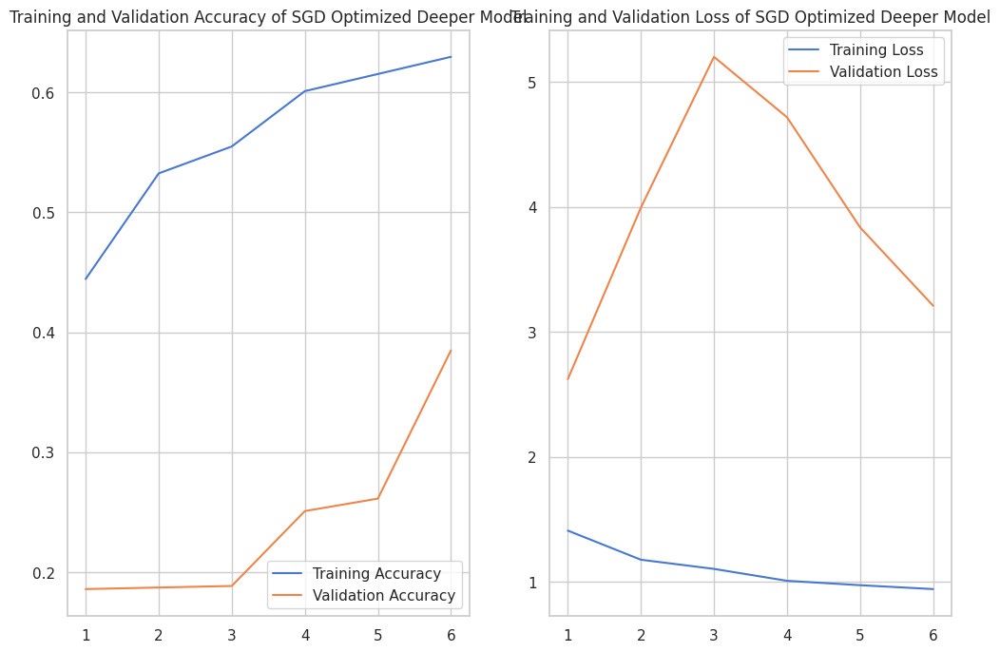

In [ ]:
# Plot training and validation accuracy and loss curves for the deeper regularized CNN model trained with SGD optimizer
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

# Adjust the lengths of the arrays to match the actual number of epochs executed
epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy of SGD Optimized Deeper Model')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss of SGD Optimized Deeper Model')
plt.show()

In [ ]:
test_loss, test_accuracy = cnn_model2.evaluate(val_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - accuracy: 0.3644 - loss: 3.0489
Test Loss: 3.2103610038757324
Test Accuracy: 0.38491547107696533


14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - accuracy: 0.3833 - loss: 3.1913
Test Loss: 3.2275424003601074
Test Accuracy: 0.37674418091773987
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


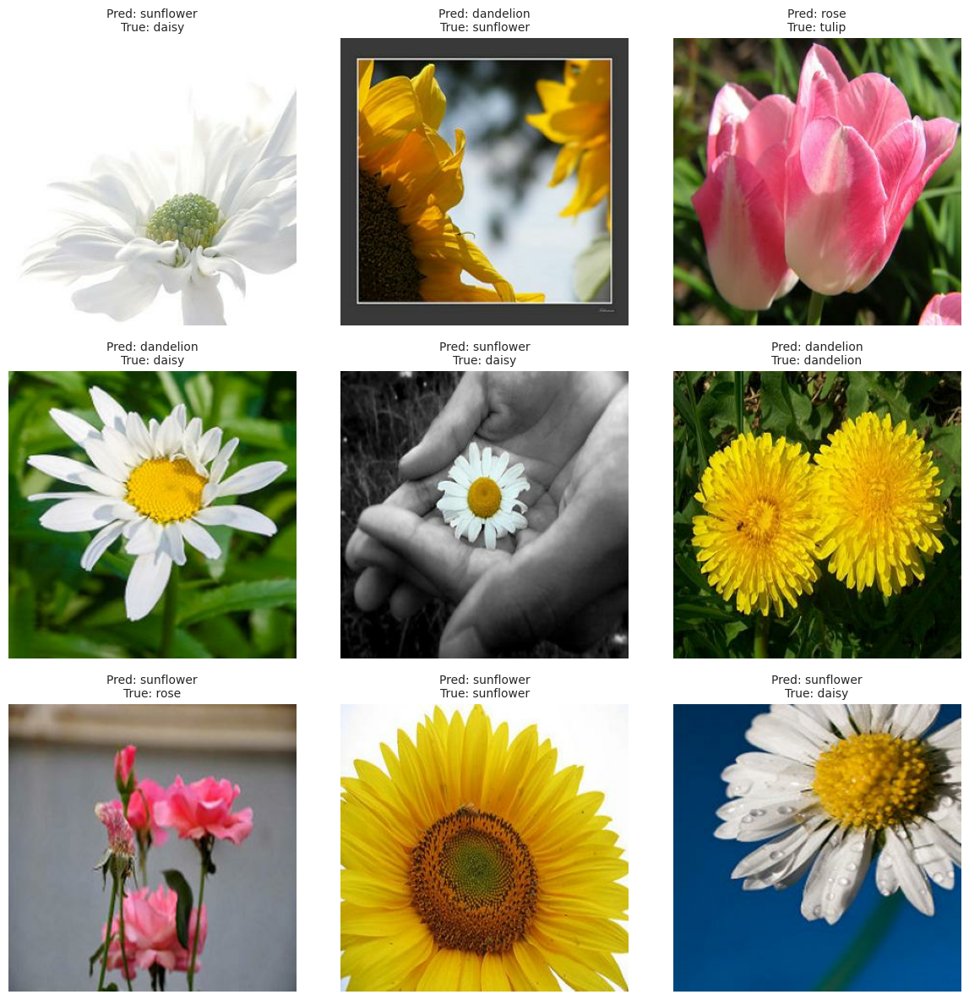

In [ ]:
# Evaluate the deeper regularized CNN model on the test dataset, and visualize predictions for 9 random test images with their predicted and true class labels
def predict_and_plot(model, dataset, class_names):
    plt.figure(figsize=(12, 12))
    for images, labels in dataset.take(1):
        # Predict the labels for the images
        predictions = model.predict(images)
        images = images.numpy()  # Convert images to NumPy arrays
        labels = labels.numpy()  # Convert labels to NumPy arrays

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].astype("uint8"))

            predicted_label = class_names[np.argmax(predictions[i])]

            # Ensure labels[i] is an integer index
            true_label_index = np.argmax(labels[i])
            true_label = class_names[true_label_index]  # Convert to integer index

            plt.title(f"Pred: {predicted_label}\nTrue: {true_label}", fontsize=10)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

# Evaluate the model on the test dataset
test_loss, test_accuracy = cnn_model2.evaluate(test_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Predict and plot examples from the test set
predict_and_plot(cnn_model2, test_ds, class_names)


In [ ]:
cnn_model2.save('SachinGyawali2330812_cnn_model_sgd.h5')

In [ ]:
# Load a previously saved CNN model trained with SGD, predict on the full test dataset, and generate a classification report comparing predicted vs true labels
loaded_model = keras.models.load_model('SachinGyawali2330812_cnn_model_sgd.h5')
print("Model loaded for predictions")

# Collect all test images and labels
all_images = []
all_labels = []
for images, labels in test_ds:
    all_images.append(images.numpy())
    all_labels.append(labels.numpy())

# Concatenate batches into single arrays
test_images = np.concatenate(all_images, axis=0)  # Shape: (30, 128, 128, 3)
test_labels_onehot = np.concatenate(all_labels, axis=0)  # Shape: (30, 6)

# Make predictions
predictions = loaded_model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_labels_onehot
if true_labels.ndim > 1:
    true_labels = np.argmax(true_labels, axis=1)


print(f"Class names: {class_names}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=class_names)
print("Classification Report:\n", report)

Model loaded for predictions
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step
Class names: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
Classification Report:
               precision    recall  f1-score   support

       daisy       0.75      0.04      0.07        76
   dandelion       0.34      0.34      0.34       105
        rose       0.47      0.09      0.15        78
   sunflower       0.30      0.93      0.45        73
       tulip       0.62      0.49      0.55        98

    accuracy                           0.38       430
   macro avg       0.50      0.38      0.31       430
weighted avg       0.49      0.38      0.33       430



In [ ]:
# Recompile the regularized CNN model using the Adam optimizer for potentially improved training performance
cnn_model2.compile(loss="categorical_crossentropy",optimizer="adam",metrics=["accuracy"])


In [ ]:
cnn_model2.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_2 (Rescaling)         │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (32, 300, 300, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (32, 300, 300, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (32, 150, 150, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (32, 150, 150, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (32, 150, 150, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (32, 150, 150, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (32, 75, 75, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (32, 75, 75, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (32, 75, 75, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (32, 75, 75, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (32, 37, 37, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (32, 37, 37, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (32, 37, 37, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (32, 37, 37, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (32, 18, 18, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (32, 18, 18, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (32, 82944)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (32, 256)              │    21,233,920 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (32, 256)              │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (32, 128)              │        32,896 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 21,667,269 (82.65 MB)

 Trainable params: 21,665,541 (82.65 MB)

 Non-trainable params: 1,728 (6.75 KB)

In [ ]:
# Retrain the CNN model using the Adam optimizer for 50 epochs with early stopping and model checkpointing enabled
epochs = 50
history = cnn_model2.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[callbacks]
)

Epoch 1/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 39s 334ms/step - accuracy: 0.3876 - loss: 1.6081 - val_accuracy: 0.2380 - val_loss: 2.6684
Epoch 2/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 35s 363ms/step - accuracy: 0.4961 - loss: 1.2069 - val_accuracy: 0.2536 - val_loss: 2.1376
Epoch 3/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 35s 355ms/step - accuracy: 0.5576 - loss: 1.1057 - val_accuracy: 0.3459 - val_loss: 1.5835
Epoch 4/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 34s 350ms/step - accuracy: 0.5662 - loss: 1.0527 - val_accuracy: 0.4044 - val_loss: 1.3941
Epoch 5/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 33s 335ms/step - accuracy: 0.6072 - loss: 1.0117 - val_accuracy: 0.5709 - val_loss: 1.0984
Epoch 6/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 44s 365ms/step - accuracy: 0.6424 - loss: 0.9309 - val_accuracy: 0.4304 - val_loss: 1.6713
Epoch 7/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 39s 340ms/step - accuracy: 0.6348 - loss: 0.9117 - val_accuracy: 0.6463 - val_loss: 0.9182
Epoch 8/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 41s 342ms/step - accuracy: 0.6551 - loss: 0.8932 - val_accu

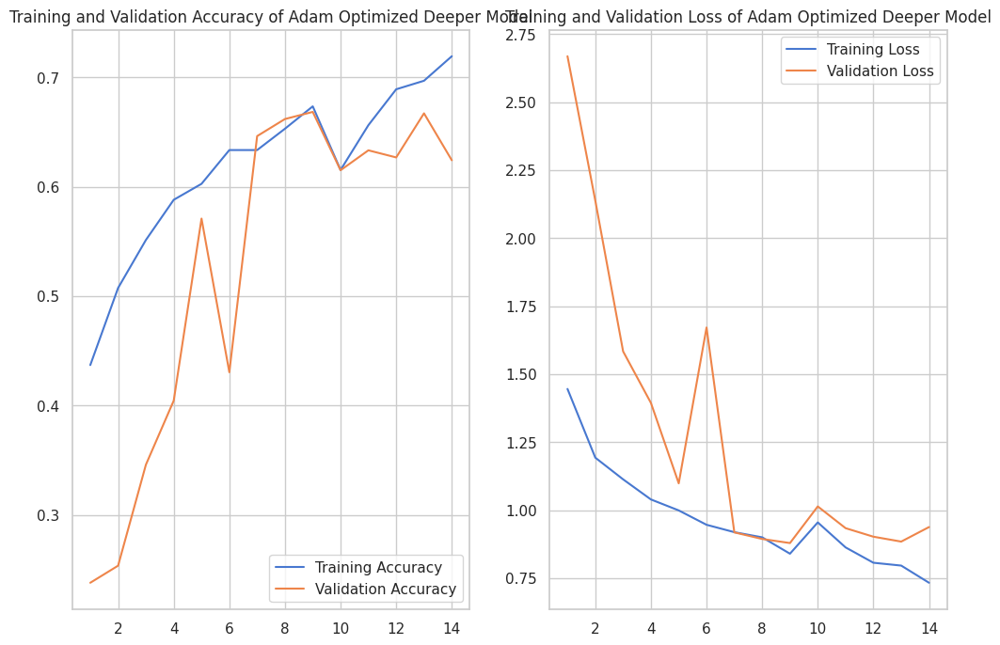

In [ ]:
# Plot accuracy and loss curves for the CNN model trained using the Adam optimizer to compare training and validation performance over epochs
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

# Adjust the lengths of the arrays to match the actual number of epochs executed
epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy of Adam Optimized Deeper Model')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss of Adam Optimized Deeper Model')
plt.show()

In [ ]:
# Evaluate the CNN model (trained with Adam optimizer) on the validation dataset and print the resulting loss and accuracy
test_loss, test_accuracy = cnn_model2.evaluate(val_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - accuracy: 0.6278 - loss: 0.9434
Test Loss: 0.9377481937408447
Test Accuracy: 0.6241872310638428


14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.6185 - loss: 0.9777
Test Loss: 0.9888967871665955
Test Accuracy: 0.6093023419380188
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


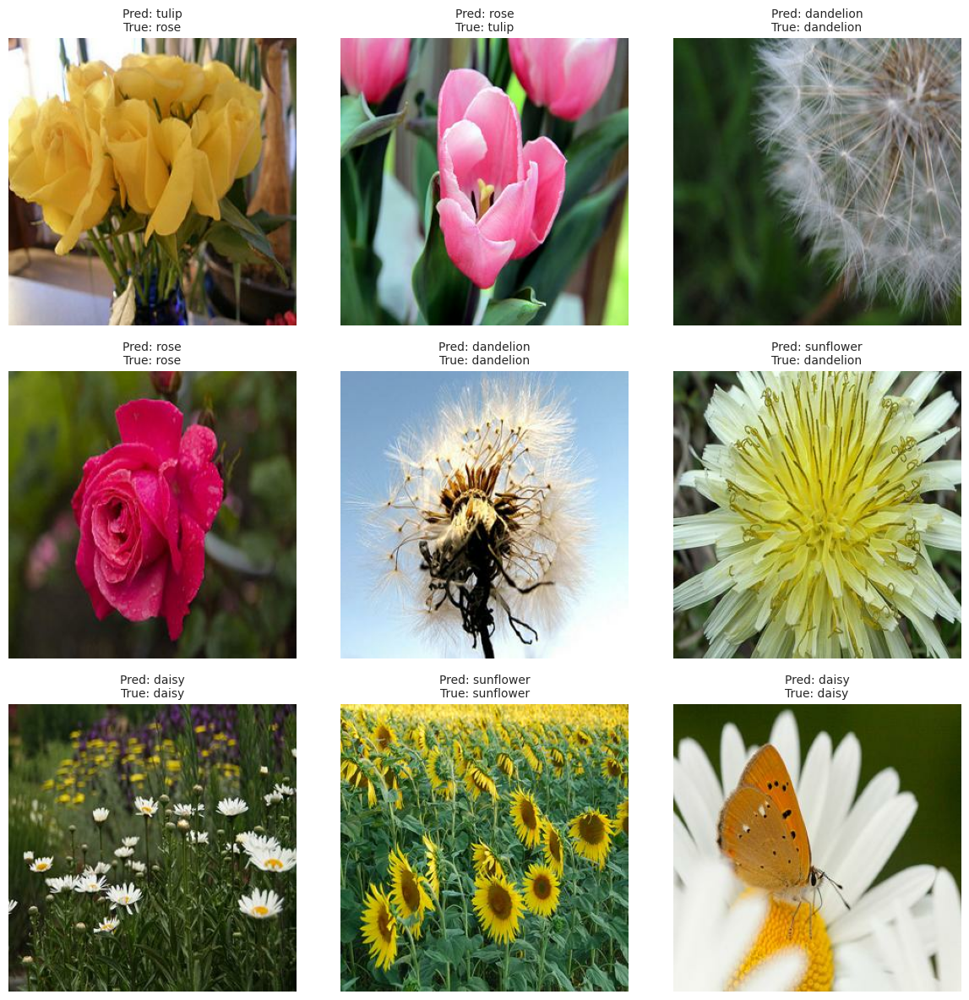

In [ ]:
 """
    Predicts labels on a batch of images from the dataset using the given model
    and plots 9 sample images with their predicted and true class labels.

    Parameters:
    - model: Trained Keras model to use for prediction.
    - dataset: tf.data.Dataset object (e.g., test set).
    - class_names: List of class names corresponding to label indices.
    """

def predict_and_plot(model, dataset, class_names):
    plt.figure(figsize=(12, 12))
    for images, labels in dataset.take(1):
        # Predict the labels for the images
        predictions = model.predict(images)
        images = images.numpy()  # Convert images to NumPy arrays
        labels = labels.numpy()  # Convert labels to NumPy arrays

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].astype("uint8"))

            predicted_label = class_names[np.argmax(predictions[i])]

            # Ensure labels[i] is an integer index
            true_label_index = np.argmax(labels[i])
            true_label = class_names[true_label_index]  # Convert to integer index

            plt.title(f"Pred: {predicted_label}\nTrue: {true_label}", fontsize=10)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

# Evaluate the model on the test dataset
test_loss, test_accuracy = cnn_model2.evaluate(test_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Predict and plot examples from the test set
predict_and_plot(cnn_model2, test_ds, class_names)


In [ ]:
cnn_model2.save('SachinGyawali2330812_cnn_model_adam.h5')

In [ ]:
# This script loads a trained CNN model, prepares the test dataset by collecting all images and labels,
# performs predictions on the test data, converts the results into class indices,
# and finally generates a classification report to evaluate the model's performance.
loaded_model = keras.models.load_model('SachinGyawali2330812_cnn_model_adam.h5')
print("Model loaded for predictions")

# Collect all test images and labels
all_images = []
all_labels = []
for images, labels in test_ds:
    all_images.append(images.numpy())
    all_labels.append(labels.numpy())

# Concatenate batches into single arrays
test_images = np.concatenate(all_images, axis=0)  # Shape: (30, 128, 128, 3)
test_labels_onehot = np.concatenate(all_labels, axis=0)  # Shape: (30, 6)

# Make predictions
predictions = loaded_model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_labels_onehot
if true_labels.ndim > 1:
    true_labels = np.argmax(true_labels, axis=1)


print(f"Class names: {class_names}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=class_names)
print("Classification Report:\n", report)

Model loaded for predictions
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step
Class names: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
Classification Report:
               precision    recall  f1-score   support

       daisy       0.68      0.54      0.60        76
   dandelion       0.70      0.76      0.73       105
        rose       0.44      0.69      0.54        78
   sunflower       0.88      0.63      0.74        73
       tulip       0.51      0.42      0.46        98

    accuracy                           0.61       430
   macro avg       0.64      0.61      0.61       430
weighted avg       0.64      0.61      0.61       430



## Transfer Learning using RESNET model

In [ ]:
# Load the training subset of the image dataset from the specified directory with 80/20 train-validation split.
train_ds = train_ds = tf.keras.utils.image_dataset_from_directory(
resized_train_ds_path,
batch_size=32,
image_size=(256, 256),
shuffle=True,
seed=123,
validation_split=0.2,
subset="training",
)

Found 3847 files belonging to 5 classes.
Using 3078 files for training.


In [ ]:
# Loads the validation dataset from the directory with a 20% validation split and shuffling.
val_ds = train_ds = tf.keras.utils.image_dataset_from_directory(
resized_train_ds_path,
batch_size=32,
image_size=(256, 256),
shuffle=True,
seed=123,
validation_split=0.2,
subset="validation",
)

Found 3847 files belonging to 5 classes.
Using 769 files for validation.


In [ ]:
# Applies one-hot encoding to the labels (y) for both training and validation datasets with 5 classes.
train_ds = train_ds.map(lambda x, y: (x, tf.one_hot(y, depth=5)))
val_ds = val_ds.map(lambda x, y: (x, tf.one_hot(y, depth=5)))

In [ ]:
# Defines a ResNet50-based model for image classification with pre-trained weights, freezes its layers, and adds custom layers for classification with 5 output classes.
resnet_model = Sequential()

pretrained_model= tf.keras.applications.ResNet50(include_top=False,
                   input_shape=(256,256,3),
                   pooling='avg',classes=5,
                   weights='imagenet')
for layer in pretrained_model.layers:
        layer.trainable=False

resnet_model.add(pretrained_model)
resnet_model.add(layers.Flatten())
resnet_model.add(layers.Dense(512, activation='relu'))
resnet_model.add(layers.Dropout(0.5)),
resnet_model.add(layers.BatchNormalization()),
resnet_model.add(layers.Dense(5, activation='softmax'))

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [ ]:
# Compiles the ResNet50-based model with the Adam optimizer, categorical crossentropy loss, and accuracy as the evaluation metric.
resnet_model.compile(optimizer=Adam(learning_rate=0.001),loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
resnet_model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 2048)           │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,641,413 (94.00 MB)

 Trainable params: 1,052,677 (4.02 MB)

 Non-trainable params: 23,588,736 (89.98 MB)

In [ ]:
# Trains the ResNet50-based model for 20 epochs using the training and validation datasets.
epochs=20
history = resnet_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 33s 646ms/step - accuracy: 0.5742 - loss: 1.1928 - val_accuracy: 0.8882 - val_loss: 0.2903
Epoch 2/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 223ms/step - accuracy: 0.8334 - loss: 0.3994 - val_accuracy: 0.9415 - val_loss: 0.1763
Epoch 3/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 231ms/step - accuracy: 0.9099 - loss: 0.2620 - val_accuracy: 0.9818 - val_loss: 0.0948
Epoch 4/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 216ms/step - accuracy: 0.9311 - loss: 0.2064 - val_accuracy: 0.9922 - val_loss: 0.0686
Epoch 5/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 13s 323ms/step - accuracy: 0.9608 - loss: 0.1324 - val_accuracy: 0.9987 - val_loss: 0.0545
Epoch 6/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 255ms/step - accuracy: 0.9653 - loss: 0.1056 - val_accuracy: 1.0000 - val_loss: 0.0419
Epoch 7/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 212ms/step - accuracy: 0.9738 - loss: 0.1131 - val_accuracy: 0.9974 - val_loss: 0.0382
Epoch 8/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.9853 - loss: 0.0765 - val_accuracy

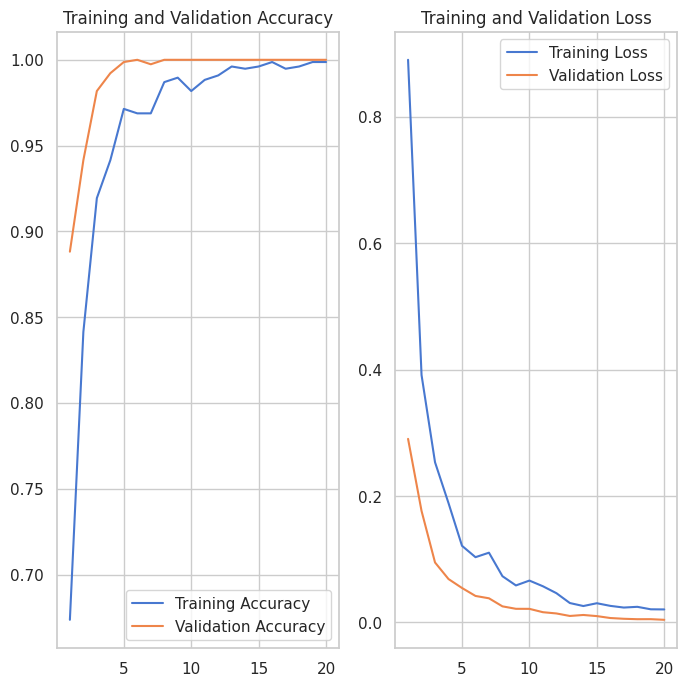

In [ ]:
# Plots the training and validation accuracy and loss over the epochs for the ResNet50-based model to visualize performance during training.
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

# Adjust the lengths of the arrays to match the actual number of epochs executed
epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
# Evaluates the trained ResNet50-based model on the validation dataset and prints the test loss and accuracy.
test_loss, test_accuracy = resnet_model.evaluate(val_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - accuracy: 1.0000 - loss: 0.0042 
Test Loss: 0.004200629889965057
Test Accuracy: 1.0


Found 430 files belonging to 5 classes.
14/14 ━━━━━━━━━━━━━━━━━━━━ 7s 460ms/step - accuracy: 0.8371 - loss: 0.4616
Test Loss: 0.42545127868652344
Test Accuracy: 0.8627907037734985
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


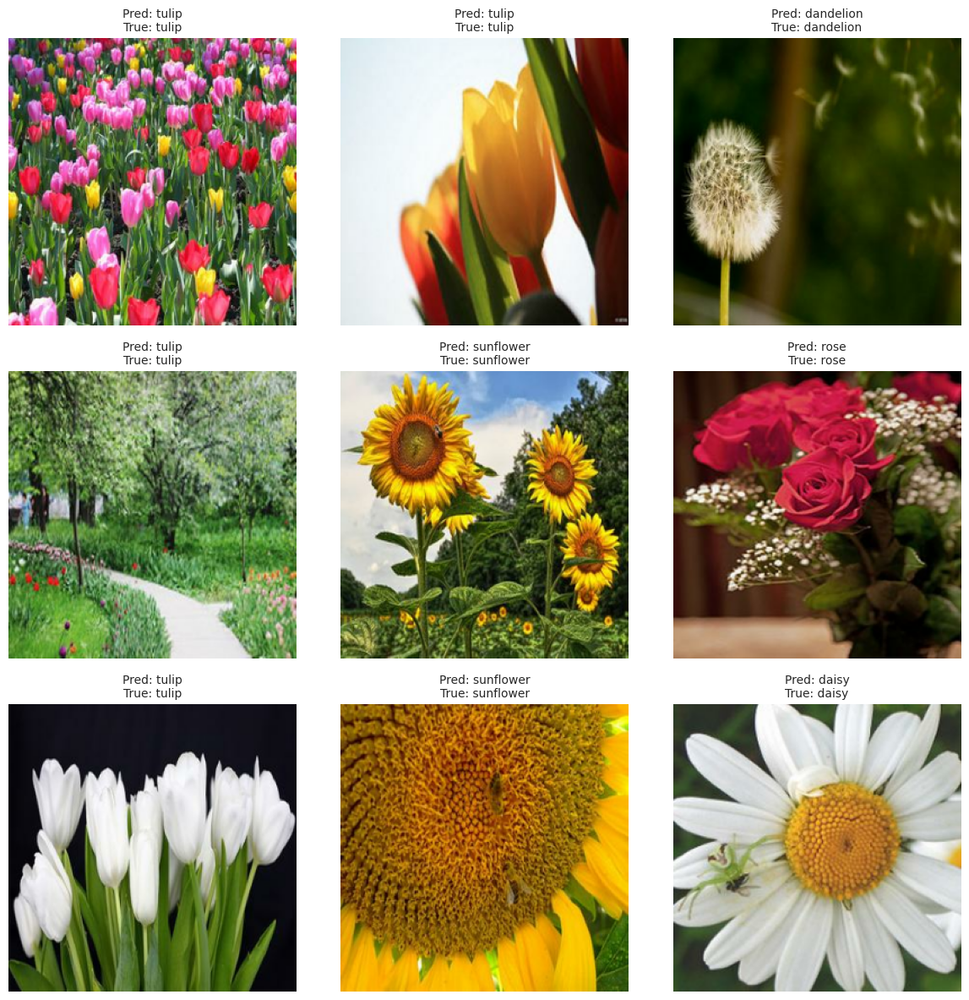

In [ ]:
# Defines a function to predict labels for test images using the ResNet model, plot the predicted vs true labels, and evaluate the model on the test dataset.
# The test images are processed, and the one-hot encoded labels are passed to the model for prediction, followed by visualization of the results in a grid.

def predict_and_plot(model, dataset, class_names):
    plt.figure(figsize=(12, 12))
    for images, labels in dataset.take(1):
        # Predict the labels for the images
        predictions = model.predict(images)
        images = images.numpy()  # Convert images to NumPy arrays
        labels = labels.numpy()  # Convert labels to NumPy arrays

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].astype("uint8"))

            predicted_label = class_names[np.argmax(predictions[i])]

            # Ensure labels[i] is an integer index
            true_label_index = np.argmax(labels[i])
            true_label = class_names[true_label_index]  # Convert to integer index

            plt.title(f"Pred: {predicted_label}\nTrue: {true_label}", fontsize=10)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

# Create test dataset
test_dir = "/content/drive/MyDrive/6CS012 AI & ML/Flower Classification/DataSplit/test"
test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    batch_size=32,
    image_size=(256, 256),
    shuffle=True
)
# Convert test_ds labels to one-hot encoded format
test_ds = test_ds.map(lambda x, y: (x, tf.one_hot(y, depth=5)))

# Evaluate the model on the test dataset
test_loss, test_accuracy = resnet_model.evaluate(test_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Predict and plot examples from the test set
predict_and_plot(resnet_model, test_ds, class_names)


In [ ]:
resnet_model.save('SachinGyawali2330812_cnn_transferlearning_model.h5')

In [ ]:
# Loads a pre-trained CNN model, collects test images and labels, makes predictions on the test set, and generates a classification report based on true and predicted labels.
# The true labels are converted from one-hot encoding to integer indices before generating the report.
loaded_model = keras.models.load_model('SachinGyawali2330812_cnn_transferlearning_model.h5')
print("Model loaded for predictions")

# Collect all test images and labels
all_images = []
all_labels = []
for images, labels in test_ds:
    all_images.append(images.numpy())
    all_labels.append(labels.numpy())

# Concatenate batches into single arrays
test_images = np.concatenate(all_images, axis=0)
test_labels_onehot = np.concatenate(all_labels, axis=0)

# Make predictions
predictions = loaded_model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_labels_onehot
if true_labels.ndim > 1:
    true_labels = np.argmax(true_labels, axis=1)


print(f"Class names: {class_names}")



# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=class_names)
print("Classification Report:\n", report)

Model loaded for predictions
14/14 ━━━━━━━━━━━━━━━━━━━━ 9s 403ms/step
Class names: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
Classification Report:
               precision    recall  f1-score   support

       daisy       0.94      0.80      0.87        76
   dandelion       0.91      0.87      0.89       105
        rose       0.75      0.86      0.80        78
   sunflower       0.87      0.93      0.90        73
       tulip       0.86      0.86      0.86        98

    accuracy                           0.86       430
   macro avg       0.87      0.86      0.86       430
weighted avg       0.87      0.86      0.86       430

